# Import the necessary libraries

In [1]:
import sqlite3
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from fbprophet.make_holidays import make_holidays_df
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from prophet import Prophet
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import copy
import matplotlib.pyplot as plt
import plotly.offline as pyoff
import plotly.graph_objs as go

# Connect to the database

In [2]:
conn = sqlite3.connect('clean_database.db')
cursor = conn.cursor()

# Check all the tables available within the database

In [3]:
cursor.execute("SELECT name FROM sqlite_master WHERE type ='table';")
print(cursor.fetchall())

[('Meteostat_Data',), ('Entsoe_Data',), ('Entsoe_Meteostat_Data',), ('Entsoe_real_data',), ('Entsoe_real_values_and_Meteostat_data',), ('Entsoe_forecasted_data',), ('Entsoe_forecasted_data_and_Meteostat_data',), ('Feature_selected_real_data',), ('Feature_selected_forecasted_data',), ('y_train',), ('y_test',), ('X_train_real',), ('X_test_real',), ('X_train_forecasted',), ('X_test_forecasted',)]


# Retrieving the necesary tables from database

In [4]:
X_train = pd.read_sql("SELECT * FROM X_train_forecasted;", conn)
X_train["timestamp"] = pd.to_datetime(X_train["timestamp"])
X_train = X_train.set_index("timestamp")

In [5]:
X_test = pd.read_sql("SELECT * FROM X_test_forecasted;", conn)
X_test["timestamp"] = pd.to_datetime(X_test["timestamp"])
X_test = X_test.set_index("timestamp")

In [6]:
y_train = pd.read_sql("SELECT * FROM y_train;", conn)
y_train["timestamp"] = pd.to_datetime(y_train["timestamp"])
y_train = y_train.set_index("timestamp")

In [7]:
y_test = pd.read_sql("SELECT * FROM y_test;", conn)
y_test["timestamp"] = pd.to_datetime(y_test["timestamp"])
y_test = y_test.set_index("timestamp")

# LinearRegression

### Train

In [8]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [9]:
reg1 = LinearRegression()
reg1 = reg1.fit(X_train, y_train_r)
yp1 = reg1.predict(X_train)

In [74]:
rmse1 = mean_squared_error(y_true = y_train_r, y_pred = yp1, squared=False)
mae1 = mean_absolute_error(y_true = y_train_r, y_pred = yp1)
mape1 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp1)
print(f"RMSE value: {rmse1}. MAE value: {mae1}. MAPE value: {mape1}")

RMSE value: 358.79105182515025. MAE value: 268.1893436832454. MAPE value: 0.03975073600918488


In [12]:
results1 = pd.DataFrame(yp1, columns = ['yp_train'])
results1.index = y_train.index
results1["real_energy_load"] = y_train

<AxesSubplot:xlabel='timestamp'>

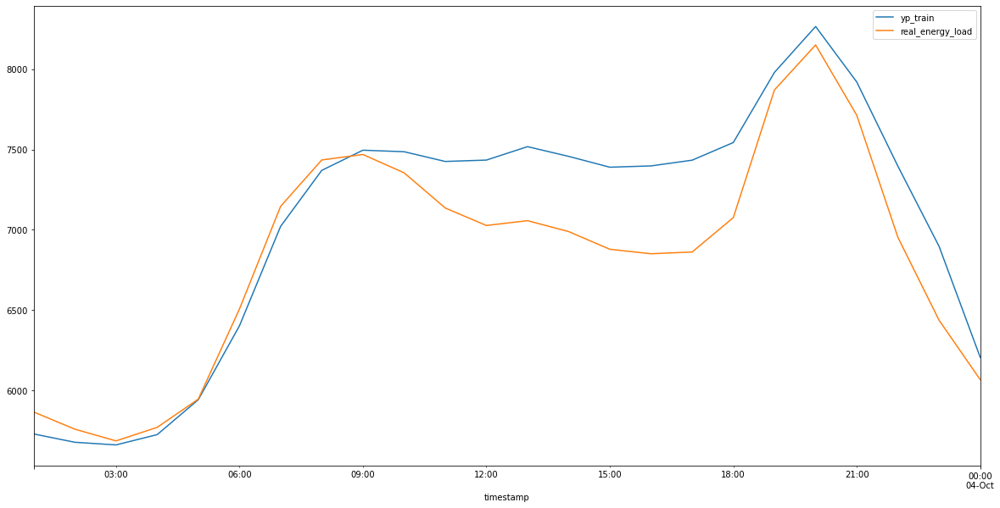

In [13]:
results1.iloc[:24,:].plot(figsize = (20,10))

In [52]:
fig_1 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_1.add_trace(go.Scatter(x = X_train.index, y = y_train["real_energy_load"], name ='Actual'))
fig_1.add_trace(go.Scatter(x = X_train.index, y = yp1, name='Predicted'))

### Test

In [14]:
yp2 = reg1.predict(X_test)

In [76]:
rmse2 = mean_squared_error(y_true = y_test_r, y_pred = yp2, squared=False)
mae2 = mean_absolute_error(y_true = y_test_r, y_pred = yp2)
mape2 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp2)
print(f"RMSE value: {rmse2}. MAE value: {mae2}. MAPE value: {mape2}")

RMSE value: 420.528297586399. MAE value: 290.3777777819078. MAPE value: 0.04201688375593348


In [83]:
results2 = pd.DataFrame(yp2, columns = ['yp_test_LinearRegression'])
results2.index = y_test.index
results2["real_energy_load"] = y_test
results2

,yp_test_LinearRegression,real_energy_load
timestamp,,
2021-08-03 01:00:00,6098.893299,6115.00
2021-08-03 02:00:00,5964.586350,5937.50
2021-08-03 03:00:00,5967.015554,5820.50
2021-08-03 04:00:00,6013.623517,5827.00
2021-08-03 05:00:00,6148.279553,5913.50
...,...,...
2021-12-31 19:00:00,7798.794968,7577.25
2021-12-31 20:00:00,7615.389679,7227.25
2021-12-31 21:00:00,7326.933626,6839.25


In [84]:
results2.to_sql("LinearRegresion_Train_Forecast_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)

<AxesSubplot:xlabel='timestamp'>

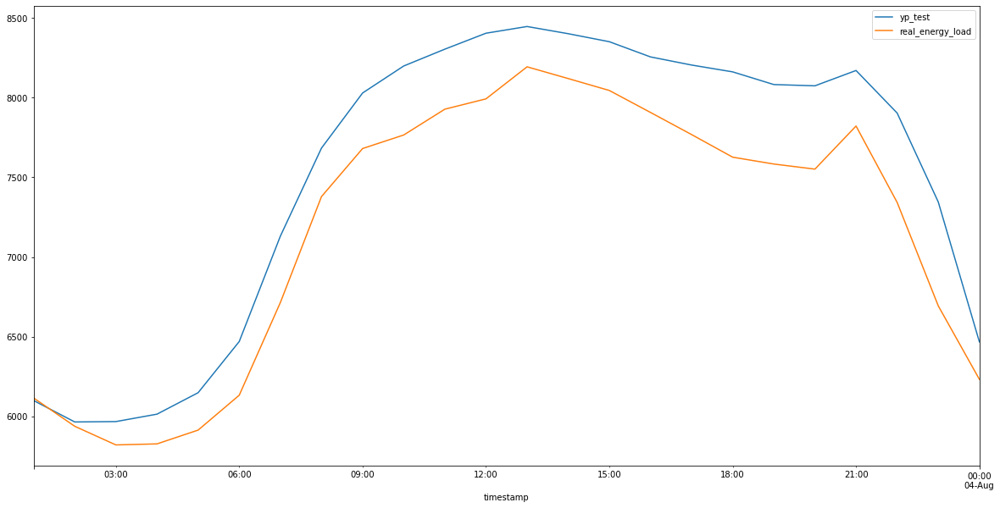

In [18]:
results2.iloc[:24,:].plot(figsize = (20,10))

In [53]:
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x = X_test.index, y = y_test["real_energy_load"], name ='Actual'))
fig_2.add_trace(go.Scatter(x = X_test.index, y = yp2, name='Predicted'))

# RandomForestRegressor

### Train

In [19]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [20]:
reg2 = RandomForestRegressor()
reg2 = reg2.fit(X_train, y_train_r)
yp3 = reg2.predict(X_train)

In [77]:
rmse3 = mean_squared_error(y_true = y_train_r, y_pred = yp3, squared=False)
mae3 = mean_absolute_error(y_true = y_train_r, y_pred = yp3)
mape3 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp3)
print(f"RMSE value: {rmse3}. MAE value: {mae3}. MAPE value: {mape3}")

RMSE value: 49.51839011615404. MAE value: 34.38415295402155. MAPE value: 0.005049307494046898


In [23]:
results3 = pd.DataFrame(yp3, columns = ['yp_train'])
results3.index = y_train.index
results3["real_energy_load"] = y_train

<AxesSubplot:xlabel='timestamp'>

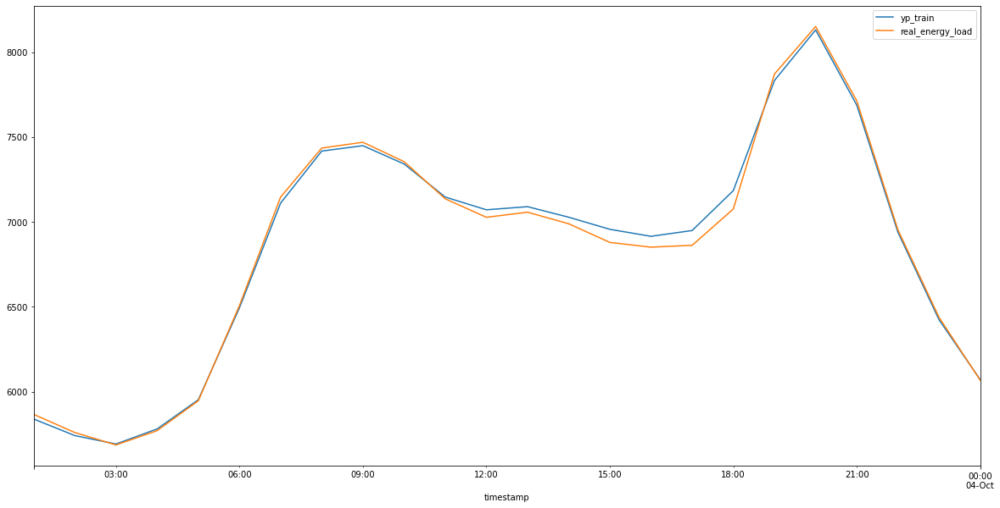

In [24]:
results3.iloc[:24,:].plot(figsize = (20,10))

In [54]:
fig_1 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_1.add_trace(go.Scatter(x = X_train.index, y = y_train["real_energy_load"], name ='Actual'))
fig_1.add_trace(go.Scatter(x = X_train.index, y = yp3, name='Predicted'))

### Test

In [25]:
yp4 = reg2.predict(X_test)

In [78]:
rmse4 = mean_squared_error(y_true = y_test_r, y_pred = yp4, squared=False)
mae4 = mean_absolute_error(y_true = y_test_r, y_pred = yp4)
mape4 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp4)
print(f"RMSE value: {rmse4}. MAE value: {mae4}. MAPE value: {mape4}")

RMSE value: 312.1309685022361. MAE value: 167.27566135558882. MAPE value: 0.024034653576434525


In [86]:
results4 = pd.DataFrame(yp4, columns = ['yp_test_RandomForest'])
results4.index = y_test.index
results4["real_energy_load"] = y_test
results4

,yp_test_RandomForest,real_energy_load
timestamp,,
2021-08-03 01:00:00,6255.188125,6115.00
2021-08-03 02:00:00,5918.100833,5937.50
2021-08-03 03:00:00,5875.803333,5820.50
2021-08-03 04:00:00,5893.490000,5827.00
2021-08-03 05:00:00,5917.017500,5913.50
...,...,...
2021-12-31 19:00:00,7731.525000,7577.25
2021-12-31 20:00:00,7775.162500,7227.25
2021-12-31 21:00:00,7126.325000,6839.25


In [87]:
results4.to_sql("RandomForest_Train_Forecast_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)

<AxesSubplot:xlabel='timestamp'>

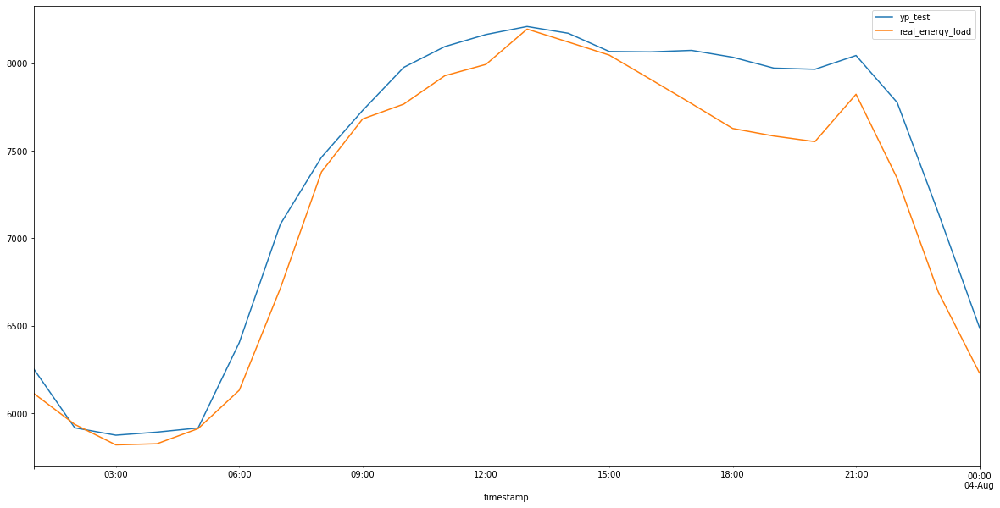

In [29]:
results4.iloc[:24,:].plot(figsize = (20,10))

In [55]:
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x = X_test.index, y = y_test["real_energy_load"], name ='Actual'))
fig_2.add_trace(go.Scatter(x = X_test.index, y = yp4, name='Predicted'))

# Prophet

### Train

In [57]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [58]:
# Create features list
features = list(X_train.columns.to_list())

In [59]:
def holidays_features(df: pd.DataFrame, country='RO'):
    """Holidays features selecton"""
    # Prophet mode
    from fbprophet.make_holidays import make_holidays_df
    year_list = df.index.year.unique().tolist()

    # Identify the final year, as an integer, and increase it by 1
    year_list.append(year_list[-1] + 1)
    holidays_df = make_holidays_df(year_list=year_list, country=country)

    return holidays_df

In [60]:
holidays_df = holidays_features(y_train)

In [61]:
X_train_prophet = X_train.copy()
X_train_prophet['y'] = y_train["real_energy_load"]
X_train_prophet = X_train_prophet.reset_index()
X_train_prophet = X_train_prophet.rename(columns = {'timestamp': 'ds'})
X_train_prophet

,ds,real_energy_produced,imported_real_energy,exported_real_energy,avg_air_temp (°C),avg_rel_humidity (%),avg_wind_speed (km/h),avg_sea-lvl_air_pres (hPa),hour,day_of_week,day_of_year,holidays_encoded,real_energy_load_lag24,real_energy_load_roll_min168,y
0,2017-10-03 01:00:00,-1.545773,-0.778136,-0.758289,-0.774438,1.016265,-0.958030,1.224477,-1.517054,-0.999896,0.894458,-0.182989,-1.470314,-0.176020,5866.00
1,2017-10-03 02:00:00,-1.574107,-0.778136,-0.758289,-0.809492,1.058201,-0.958030,1.171745,-1.372586,-0.999896,0.894458,-0.182989,-1.545699,-0.176020,5759.00
2,2017-10-03 03:00:00,-1.639881,-0.778136,-0.758289,-0.855331,1.149061,-0.958030,1.166642,-1.228119,-0.999896,0.894458,-0.182989,-1.564545,-0.176020,5686.00
3,2017-10-03 04:00:00,-1.650001,-0.778136,-0.758289,-0.880948,1.197986,-0.958030,1.149632,-1.083652,-0.999896,0.894458,-0.182989,-1.489160,-0.176020,5770.00
4,2017-10-03 05:00:00,-1.587262,-0.778136,-0.758289,-0.899823,1.149061,-1.568678,1.142828,-0.939184,-0.999896,0.894458,-0.182989,-1.244158,-0.176020,5946.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33591,2021-08-02 20:00:00,0.132999,-0.024845,0.659999,1.367883,-0.731052,0.059716,-0.736799,1.227827,-1.499933,0.314136,-0.182989,0.115133,0.171819,7991.75
33592,2021-08-02 21:00:00,0.015364,-0.019823,0.679165,1.187221,-0.248793,-0.347382,-0.665356,1.372294,-1.499933,0.314136,-0.182989,0.303597,0.171819,8087.00
33593,2021-08-02 22:00:00,-0.269491,0.032908,0.679165,1.075319,-0.109007,-0.245608,-0.605820,1.516761,-1.499933,0.314136,-0.182989,0.089220,0.171819,7604.50
33594,2021-08-02 23:00:00,-0.772162,0.278983,0.679165,1.009256,-0.004168,-1.082421,-0.542883,1.661229,-1.499933,0.314136,-0.182989,-0.393717,0.171819,6991.25


In [62]:
# Prophet model
model = Prophet(growth='linear',          
                changepoint_range=0.3,
                changepoint_prior_scale=0.01,
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=True,
                holidays=holidays_df,
                seasonality_mode='additive',
                seasonality_prior_scale=0.5,
                holidays_prior_scale=1.0,
                #mcmc_samples=10,
                interval_width=0.90,
                uncertainty_samples=1000,
                stan_backend=None)

# Add feature data
for feature in features:
    model.add_regressor(feature)

# Add holidays data
model.add_country_holidays(country_name='RO')

# Fit model
model = model.fit(X_train_prophet)

# Make prediction
training_demand_forecast = model.predict(X_train_prophet)

In [63]:
training_demand_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Adormirea Maicii Domnului,Adormirea Maicii Domnului_lower,Adormirea Maicii Domnului_upper,Anul Nou,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2017-10-03 01:00:00,6771.634377,5428.060496,6355.009316,6771.634377,6771.634377,0.0,0.0,0.0,0.0,...,0.033574,0.033574,0.033574,0.004209,0.004209,0.004209,0.0,0.0,0.0,5889.894404
1,2017-10-03 02:00:00,6771.636553,5330.068783,6241.684420,6771.636553,6771.636553,0.0,0.0,0.0,0.0,...,0.032001,0.032001,0.032001,0.004214,0.004214,0.004214,0.0,0.0,0.0,5786.215691
2,2017-10-03 03:00:00,6771.638729,5265.236265,6187.764542,6771.638729,6771.638729,0.0,0.0,0.0,0.0,...,0.030223,0.030223,0.030223,0.004219,0.004219,0.004219,0.0,0.0,0.0,5729.008607
3,2017-10-03 04:00:00,6771.640905,5287.695351,6253.049961,6771.640905,6771.640905,0.0,0.0,0.0,0.0,...,0.028267,0.028267,0.028267,0.004224,0.004224,0.004224,0.0,0.0,0.0,5759.388595
4,2017-10-03 05:00:00,6771.643082,5530.402780,6455.873205,6771.643082,6771.643082,0.0,0.0,0.0,0.0,...,0.026160,0.026160,0.026160,0.004230,0.004230,0.004230,0.0,0.0,0.0,5966.358527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33591,2021-08-02 20:00:00,7008.773843,7397.085176,8365.865024,7008.773843,7008.773843,0.0,0.0,0.0,0.0,...,0.037610,0.037610,0.037610,0.026079,0.026079,0.026079,0.0,0.0,0.0,7868.700270
33592,2021-08-02 21:00:00,7008.781241,7424.040919,8315.391573,7008.781241,7008.781241,0.0,0.0,0.0,0.0,...,0.037377,0.037377,0.037377,0.026098,0.026098,0.026098,0.0,0.0,0.0,7864.578247
33593,2021-08-02 22:00:00,7008.788639,7050.806532,7983.510713,7008.788639,7008.788639,0.0,0.0,0.0,0.0,...,0.036840,0.036840,0.036840,0.026118,0.026118,0.026118,0.0,0.0,0.0,7511.506255
33594,2021-08-02 23:00:00,7008.796037,6536.038180,7434.000304,7008.796037,7008.796037,0.0,0.0,0.0,0.0,...,0.036015,0.036015,0.036015,0.026138,0.026138,0.026138,0.0,0.0,0.0,6990.923578


In [64]:
yp5 = training_demand_forecast["yhat"]

In [79]:
rmse5 = mean_squared_error(y_true = y_train_r, y_pred = yp5, squared=False)
mae5 = mean_absolute_error(y_true = y_train_r, y_pred = yp5)
mape5 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp5)
print(f"RMSE value: {rmse5}. MAE value: {mae5}. MAPE value: {mape5}")

RMSE value: 280.80848206450116. MAE value: 215.14471537767898. MAPE value: 0.032336421817150365


In [67]:
# Plot demand forecasting
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x=X_train_prophet['ds'], y=X_train_prophet['y'], name='Actual'))
fig_2.add_trace(go.Scatter(x=training_demand_forecast['ds'], y=training_demand_forecast['yhat'], name='Predicted'))

### Test

In [68]:
X_test_prophet = X_test.copy()
X_test_prophet['y'] = y_test["real_energy_load"]
X_test_prophet = X_test_prophet.reset_index()
X_test_prophet = X_test_prophet.rename(columns = {'timestamp': 'ds'})

In [69]:
training_demand_forecast_2 = model.predict(X_test_prophet)

In [70]:
yp6 = training_demand_forecast_2["yhat"]

In [80]:
rmse6 = mean_squared_error(y_true = y_test_r, y_pred = yp6, squared=False)
mae6 = mean_absolute_error(y_true = y_test_r, y_pred = yp6)
mape6 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp6)
print(f"RMSE value: {rmse6}. MAE value: {mae6}. MAPE value: {mape6}")

RMSE value: 365.3536785086079. MAE value: 248.4039649807403. MAPE value: 0.03695863057922573


In [73]:
# Plot demand forecasting
fig_3 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_3.add_trace(go.Scatter(x = X_test_prophet['ds'], y= X_test_prophet['y'], name='Actual'))
fig_3.add_trace(go.Scatter(x = training_demand_forecast_2['ds'], y=training_demand_forecast_2['yhat'], name='Predicted'))

In [90]:
results6 = pd.DataFrame(yp6)
results6.index = y_test.index
results6["real_energy_load"] = y_test
results6 = results6.rename(columns = {'yhat': 'yp_test_Prophet'})

In [89]:
results6.to_sql("Prophet_Train_Forecast_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)